In [1]:
import torch
import os
import sys
import numpy as np


parent = os.path.abspath(os.path.join('..'))
sys.path.append(parent)


from data.images import ImagesLibary

In [2]:
dataset = ImagesLibary(root='/storage13/datasets/facial-hq/test/images/', image_size=256)
loader = torch.utils.data.DataLoader(dataset, batch_size=16)


batch = next(iter(loader))

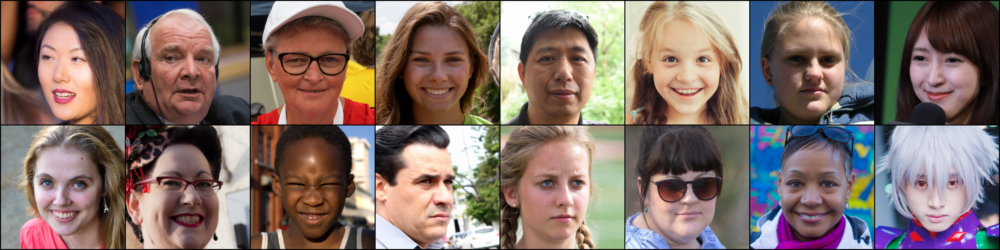

In [3]:
import numpy as np 
from PIL import Image
from einops import rearrange
from torchvision.utils import make_grid


def plot_from_tensor(x, nrow=8):
    x = torch.clamp((x + 1.0) / 2.0, min=0.0, max=1.0)
    
    grid = make_grid(x, nrow=nrow)
    grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
    
    im = Image.fromarray(grid.astype(np.uint8))
    im.show()


plot_from_tensor(batch['image'])

In [4]:
from diffusers import AutoencoderKL


vae = AutoencoderKL.from_pretrained('CompVis/stable-diffusion-v1-4', subfolder='vae')
vae.requires_grad_(False)

/home/kligvasser/miniconda3/envs/diffusers/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, ep

In [5]:
pixel_values = batch['image']

latents = vae.encode(pixel_values).latent_dist.sample() * vae.config.scaling_factor
latents /= vae.config.scaling_factor
pixel_values_rec = vae.decode(latents.type(vae.dtype), return_dict=False)[0]

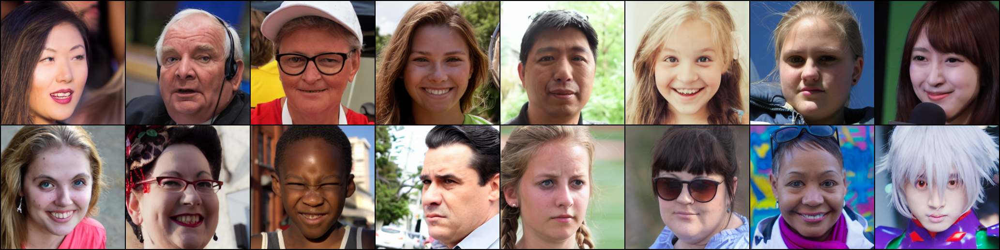

In [8]:
plot_from_tensor(pixel_values_rec)

In [5]:
from diffusers import VQModel


vqvae = VQModel.from_pretrained('CompVis/ldm-celebahq-256', subfolder='vqvae')
vqvae.requires_grad_(False)



VQModel(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): LoRACompatibleConv(128, 128, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-0

In [10]:
vqvae.config.scaling_factor

0.18215

In [14]:
pixel_values = batch['image']

latents = vqvae.encode(pixel_values, return_dict=False)[0]
pixel_values_rec = vqvae.decode(latents.type(vqvae.dtype), return_dict=False)[0]
plot_from_tensor(pixel_values_rec)

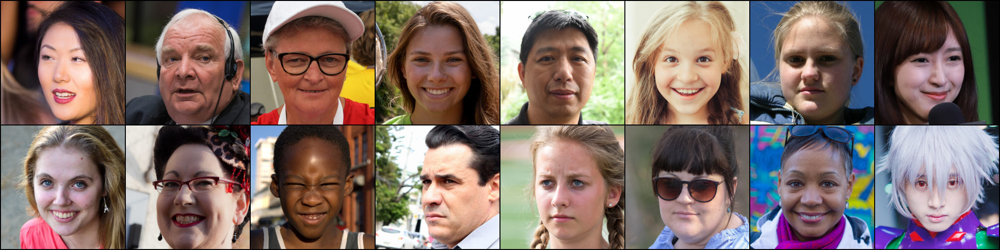

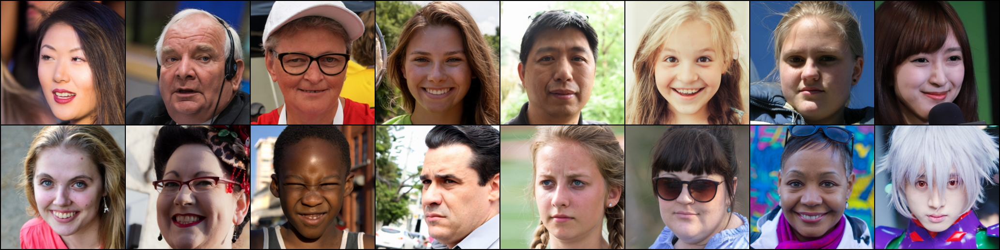

In [21]:
plot_from_tensor(pixel_values)
plot_from_tensor(pixel_values_rec)

In [25]:
from diffusers import UNet2DModel


unet = UNet2DModel.from_pretrained('CompVis/ldm-celebahq-256', subfolder='unet')

In [26]:
unet.config

FrozenDict([('sample_size', 64),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('freq_shift', 0),
            ('flip_sin_to_cos', True),
            ('down_block_types',
             ['DownBlock2D',
              'AttnDownBlock2D',
              'AttnDownBlock2D',
              'AttnDownBlock2D']),
            ('up_block_types',
             ['AttnUpBlock2D', 'AttnUpBlock2D', 'AttnUpBlock2D', 'UpBlock2D']),
            ('block_out_channels', [224, 448, 672, 896]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 1),
            ('downsample_type', 'conv'),
            ('upsample_type', 'conv'),
            ('act_fn', 'silu'),
            ('attention_head_dim', 32),
            ('norm_num_groups', 32),
            ('norm_eps', 1e-05),
            ('resnet_time_scale_shift', 'default'),
            

CLIP

In [3]:
from models.embbeders import CLIPImageEmbedder


clipper = CLIPImageEmbedder().cpu().float()

batch = next(iter(loader))
conditioned_values = dict()
for key in ['image']:
    conditioned_values[key] = batch[key].cpu().float()

embbedings = clipper(conditioned_values)

/home/kligvasser/miniconda3/envs/diffusers/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/home/kligvasser/miniconda3/envs/diffusers/lib/python3.8/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [4]:
embbedings.size()

torch.Size([16, 1, 768])

PIPE

In [4]:
from diffusers import LDMPipeline


pipe = LDMPipeline.from_pretrained('CompVis/ldm-celebahq-256')

/home/kligvasser/miniconda3/envs/diffusers/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
unet/diffusion_pytorch_model.safetensors not found
Loading pipeline components...: 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]


In [7]:
image = pipe(batch_size=16)[0]

100%|██████████| 50/50 [02:50<00:00,  3.42s/it]


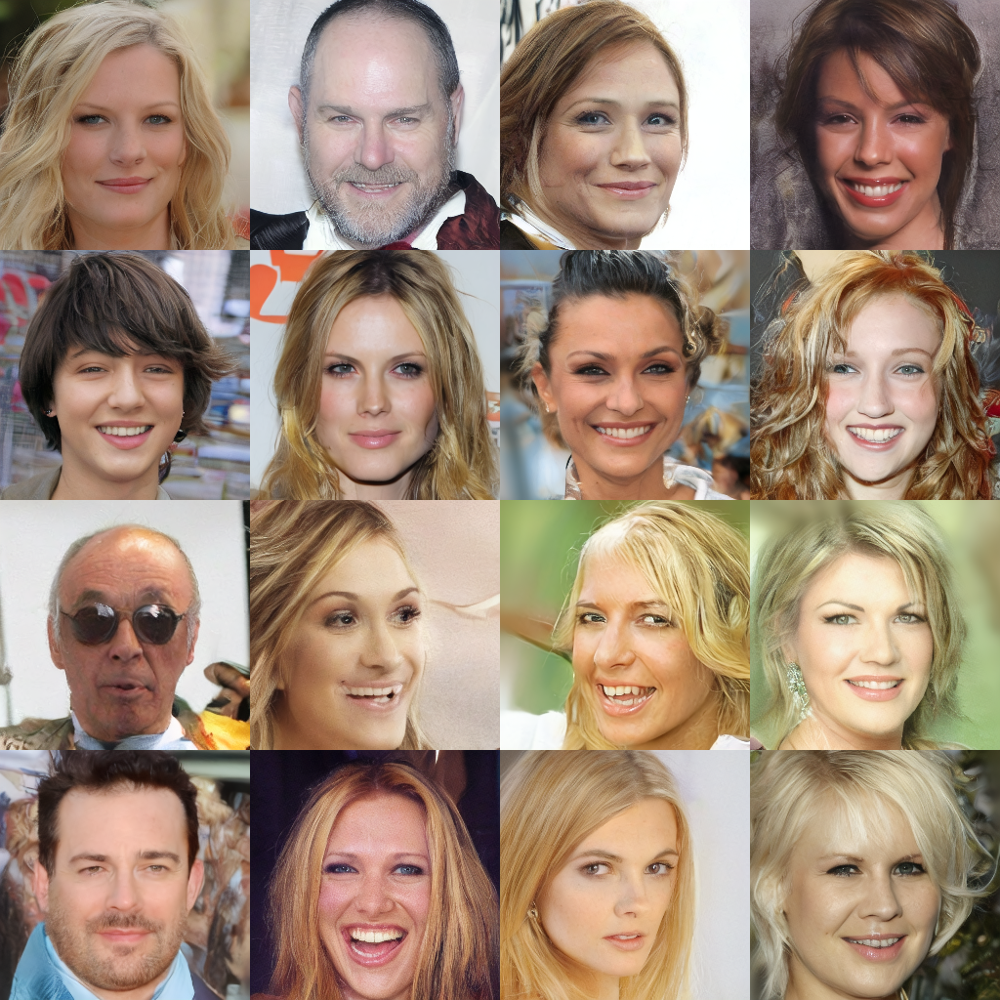

In [8]:
def make_grid(images, rows, cols):
    w, h = images[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))
    for i, image in enumerate(images):
        grid.paste(image, box=(i % cols * w, i // cols * h))
    return grid


image_grid = make_grid(image, rows=4, cols=4)
image_grid.show()

In [16]:
pipe.vqvae.config.scaling_factor

0.18215